In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np

from glob import glob
from tqdm.notebook import tqdm

import matplotlib.pyplot as plt
from PIL import Image

In [ ]:
annot = pd.read_csv('/content/annot.csv') # Skip bad lines
imgs = pd.read_parquet('/content/img.parquet')

# Load image paths
# Use glob to find all image files in the specified directory
images = glob('/content/*.jpg')  # Corrected to include *.jpg

In [ ]:
print("Annotations Data:")
print(annot.head())
print("\nImages Data:")
print(imgs.head())

Annotations Data:
   Unnamed: 0                  id          image_id  \
0           0  a4ea732cd3d5948a_1  a4ea732cd3d5948a   
1           1  a4ea732cd3d5948a_2  a4ea732cd3d5948a   
2           2  a4ea732cd3d5948a_3  a4ea732cd3d5948a   
3           3  a4ea732cd3d5948a_4  a4ea732cd3d5948a   
4           4  a4ea732cd3d5948a_5  a4ea732cd3d5948a   

                            bbox  utf8_string  \
0   [525.83, 3.4, 197.64, 33.94]  Performance   
1  [534.67, 64.68, 91.22, 38.19]        Sport   
2  [626.95, 63.62, 96.52, 31.82]        Watch   
3  [577.4, 141.87, 147.13, 43.1]   ...period.   
4  [391.03, 163.9, 60.82, 38.65]            .   

                                              points     area  
0  [525.83, 3.4, 723.47, 7.29, 722.76, 36.99, 525...  6707.90  
1  [535.73, 64.68, 623.41, 67.51, 625.89, 102.87,...  3483.69  
2  [626.95, 63.62, 721.7, 63.62, 723.47, 95.44, 6...  3071.27  
3  [580.02, 143.61, 724.53, 141.87, 723.66, 184.9...  6341.30  
4  [395.2, 163.9, 451.85, 191.94, 44

In [ ]:
img_path = images[0]  # Get the image path
image = Image.open(img_path)  # Open the image
plt.imshow(image)  # Display the image
plt.axis('off')  # Hide axes
plt.title(f"Image: {img_path.split('/')[-1]}")  # Title as the image name
plt.show()

NameError: name 'images' is not defined

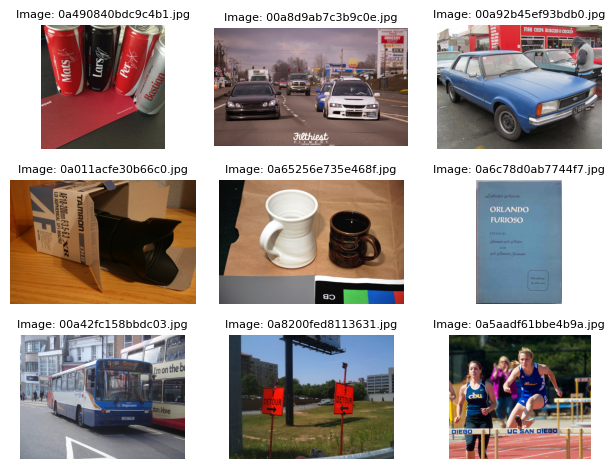

In [ ]:
# Display the first 9 images in a 3x3 grid
for i in range(9):  # Loop through the first 9 images
    img_path = images[i]  # Get the image path
    image = Image.open(img_path)  # Open the image

    plt.subplot(3, 3, i + 1)  # Create a subplot in a 3x3 grid
    plt.imshow(image)  # Display the image
    plt.axis('off')  # Hide axes
    plt.title(f"Image: {img_path.split('/')[-1]}",fontsize=8)  # Title as the image name

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

In [ ]:
# Initialize OCR models
# please install both this if u dont have installed

!pip install keras-ocr tensorflow==2.12.0
!pip install numpy matplotlib
import keras_ocr
pipeline = keras_ocr.pipeline.Pipeline()  # Keras OCR


Looking for /root/.keras-ocr/craft_mlt_25k.h5
Looking for /root/.keras-ocr/crnn_kurapan.h5


In [ ]:


# Function to process Keras OCR results
def get_kerasocr_results(image_paths):
    dfs = []
    for img in tqdm(image_paths):
        results = pipeline.recognize([img])
        img_id = img.split('/')[-1].split('.')[0]
        img_df = pd.DataFrame(results[0], columns=['text', 'bbox'])
        img_df['img_id'] = img_id
        dfs.append(img_df)
    return pd.concat(dfs)

In [ ]:
kerasocr_df = get_kerasocr_results(images[:25])  # Use first 25 images for Keras OCR

  0%|          | 0/25 [00:00<?, ?it/s]

1/1 [==============================] - 4s 4s/step


In [ ]:
def plot_compare(img_fn, kerasocr_df):
    img_id = img_fn.split('/')[-1].split('.')[0]  # Extract the image ID
    fig, axs = plt.subplots(1, 2, figsize=(15, 10))

    # Keras OCR results for the current image
    keras_results = kerasocr_df.query('img_id == @img_id')[['text', 'bbox']].values.tolist()
    keras_results = [(x[0], np.array(x[1])) for x in keras_results]  # Format as (text, bbox) pairs

    # Visualize Keras OCR results
    keras_ocr.tools.drawAnnotations(plt.imread(img_fn), keras_results, ax=axs[1])
    axs[1].set_title('Keras OCR Results', fontsize=24)

    # Show the comparison plot
    plt.show()

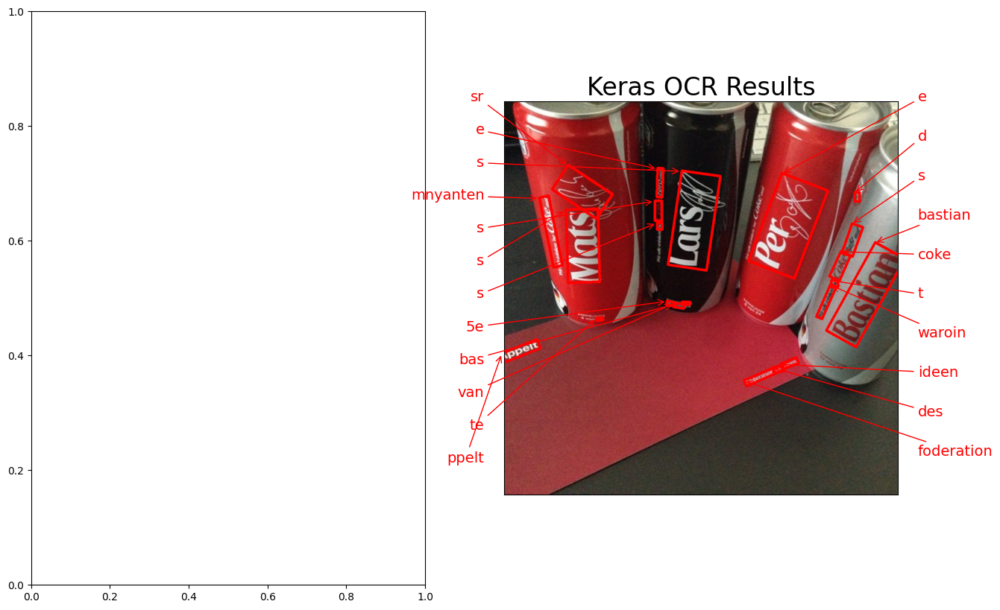

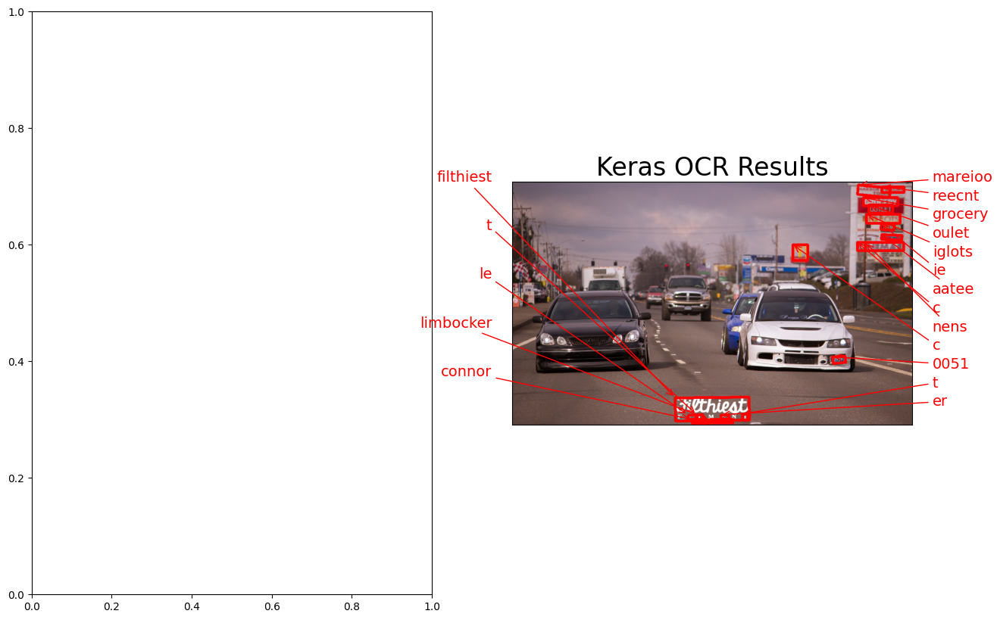

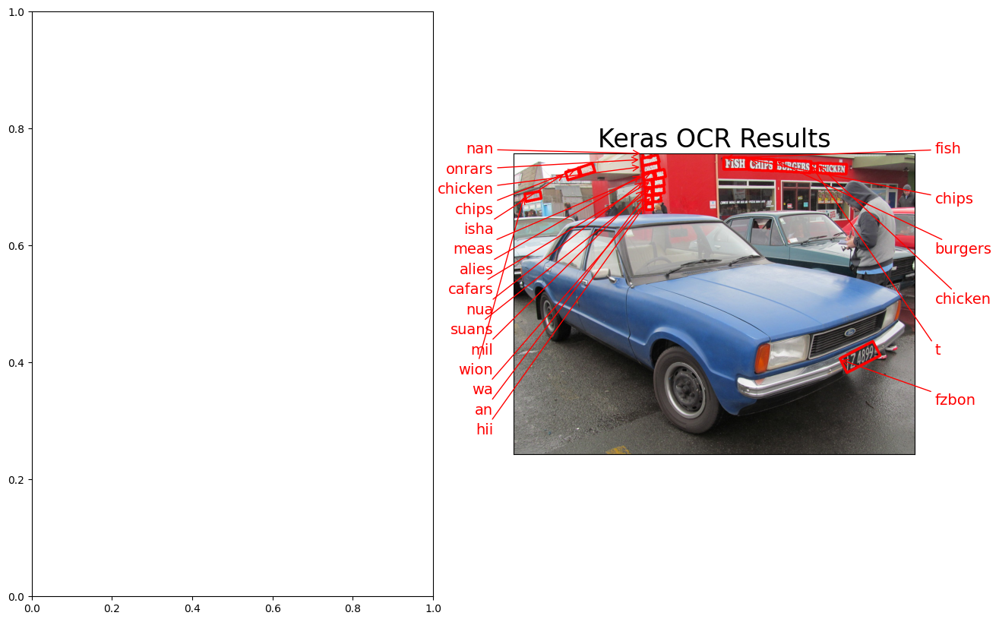

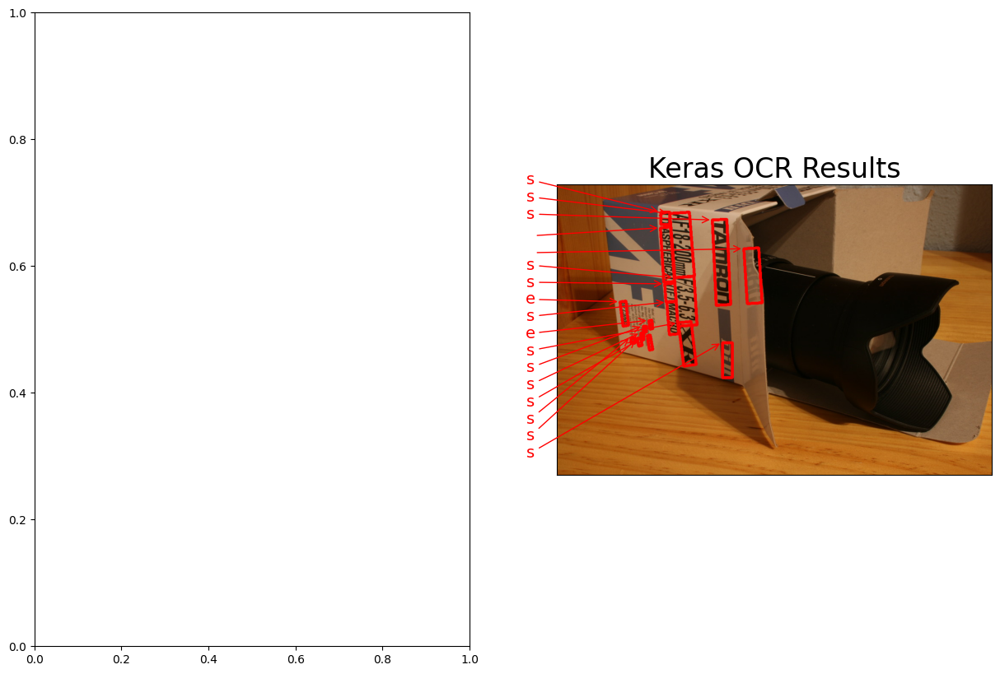

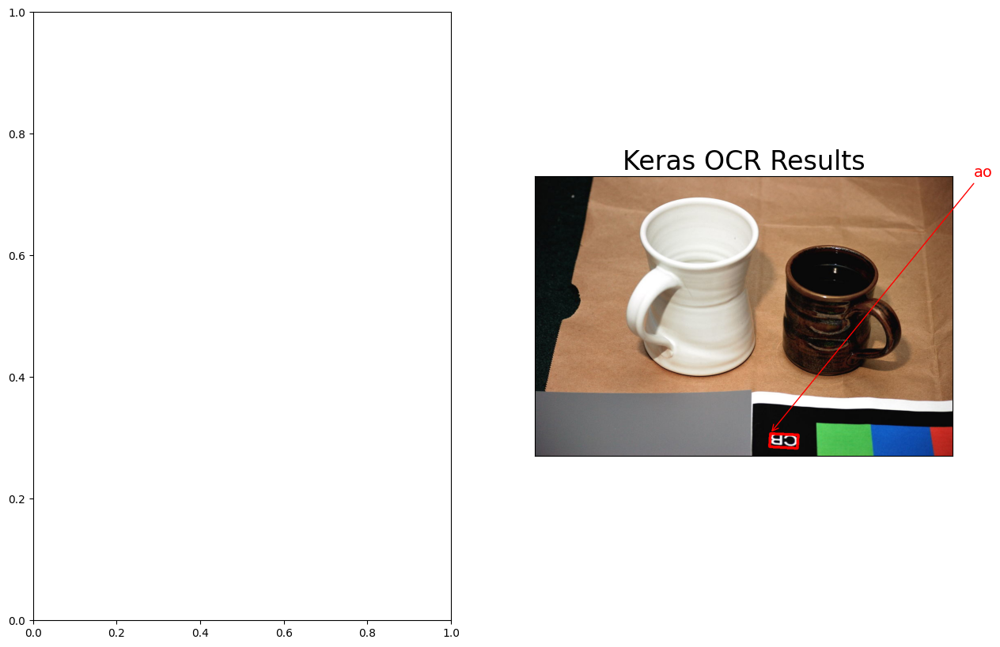

...

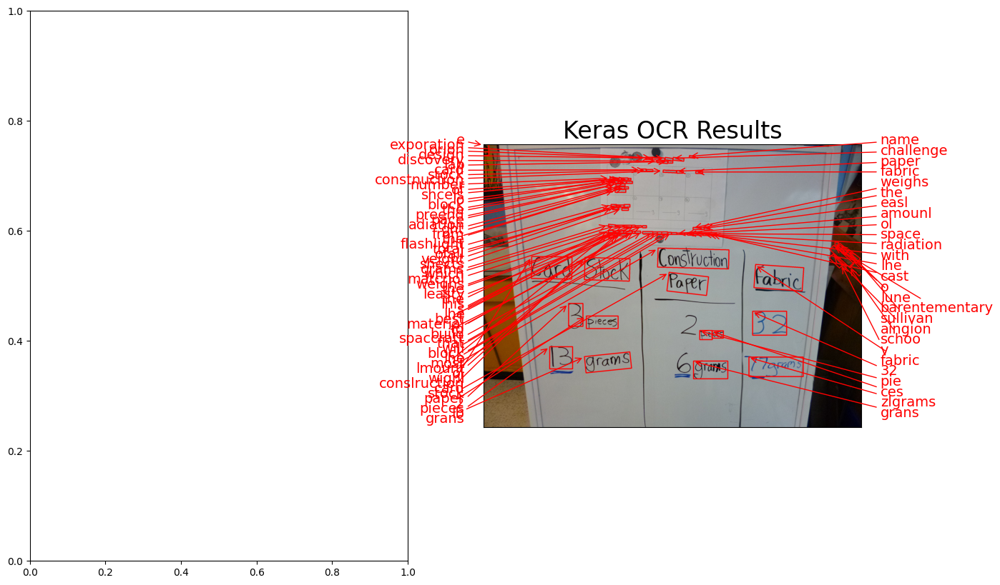

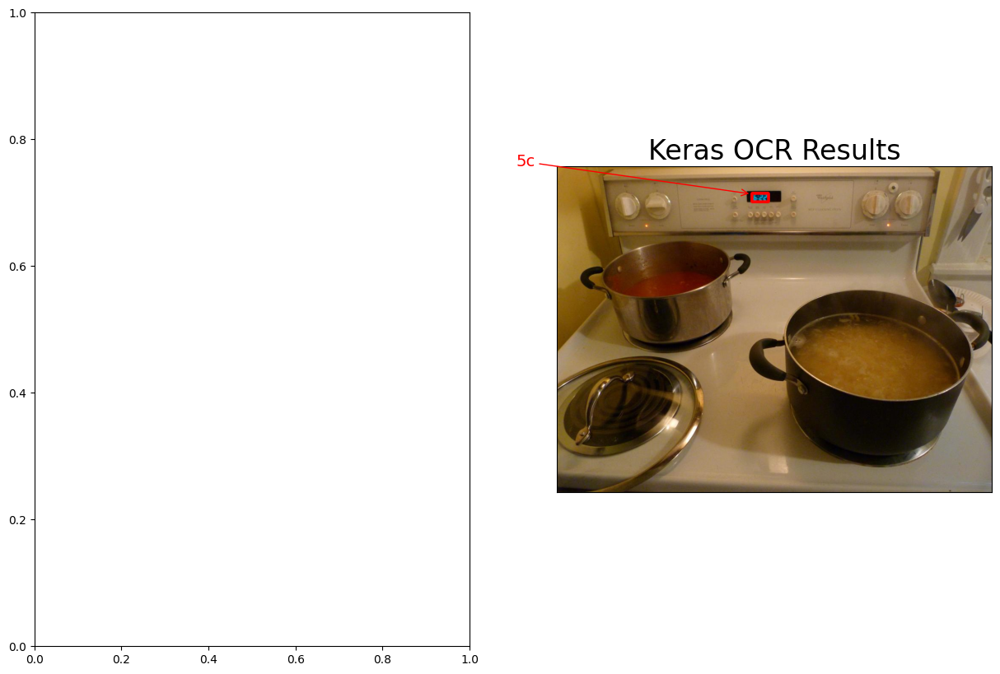

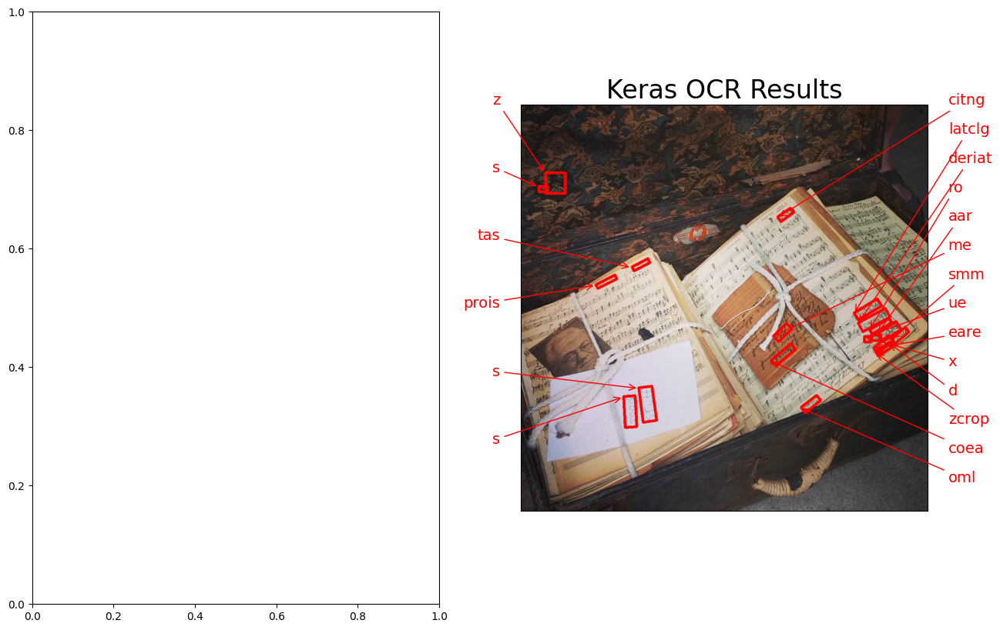

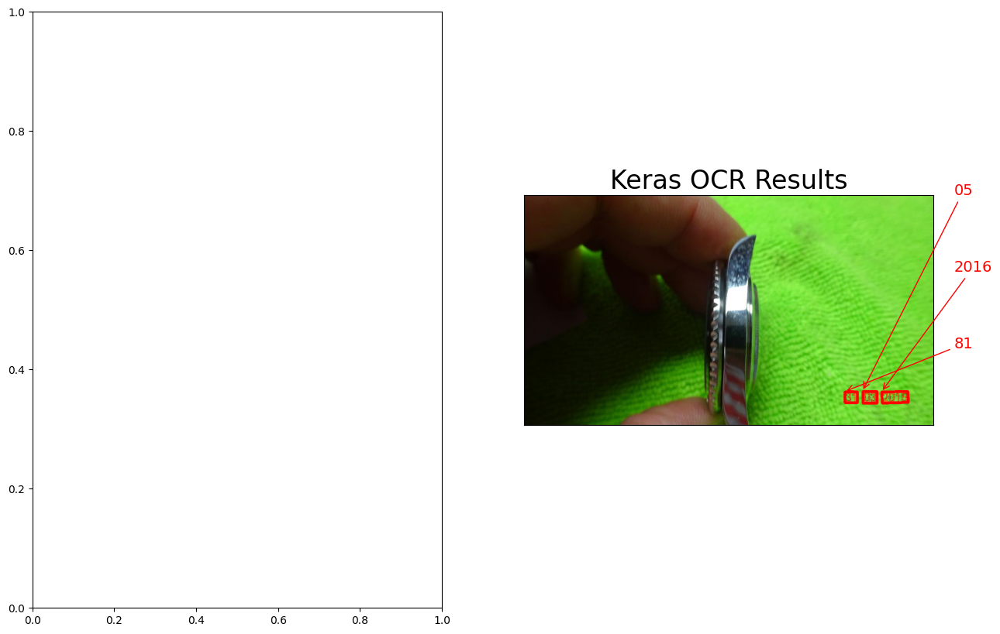

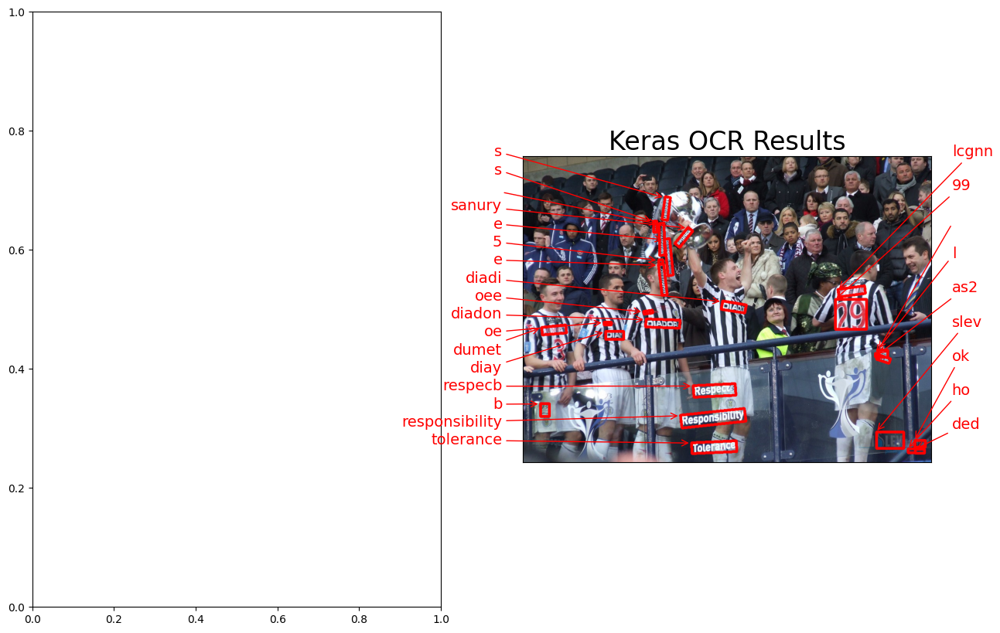

In [ ]:
for img_path in images[:20]:  # Adjust the range as needed
    plot_compare(img_path, kerasocr_df)

  0%|          | 0/25 [00:00<?, ?it/s]

1/1 [==============================] - 2s 2s/step


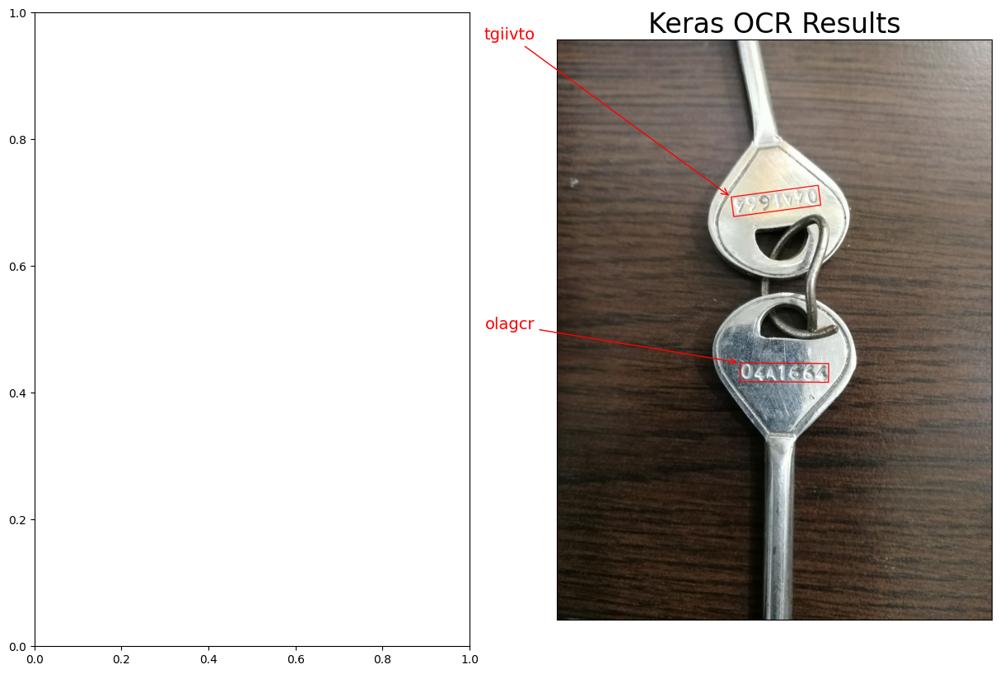

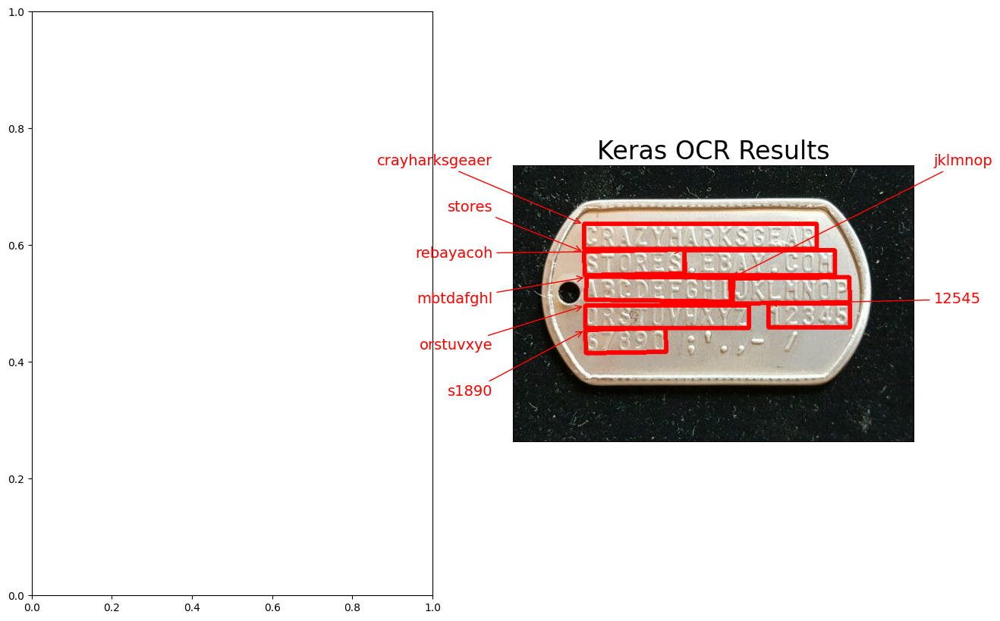

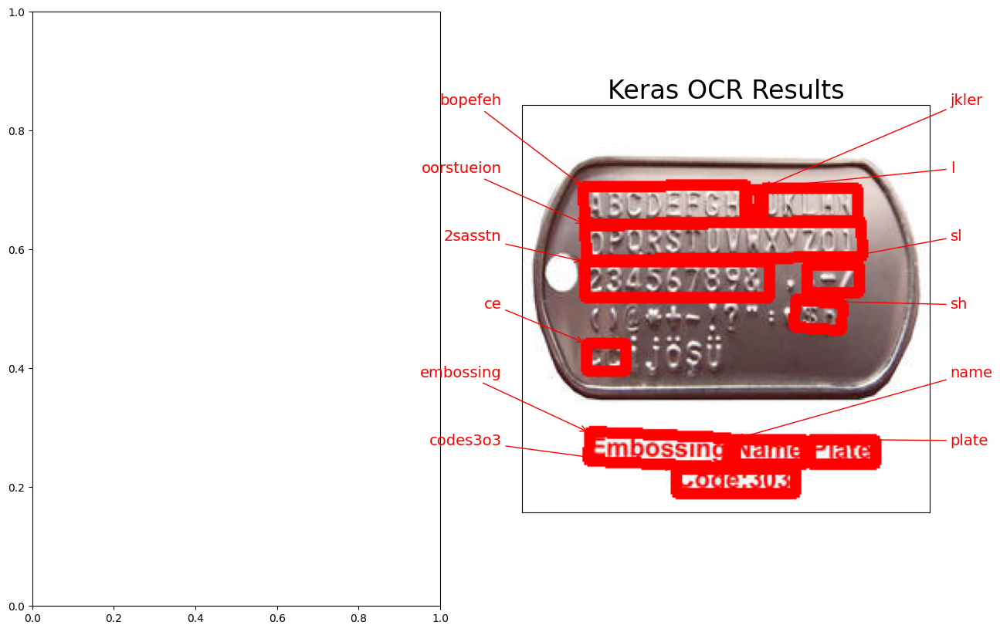

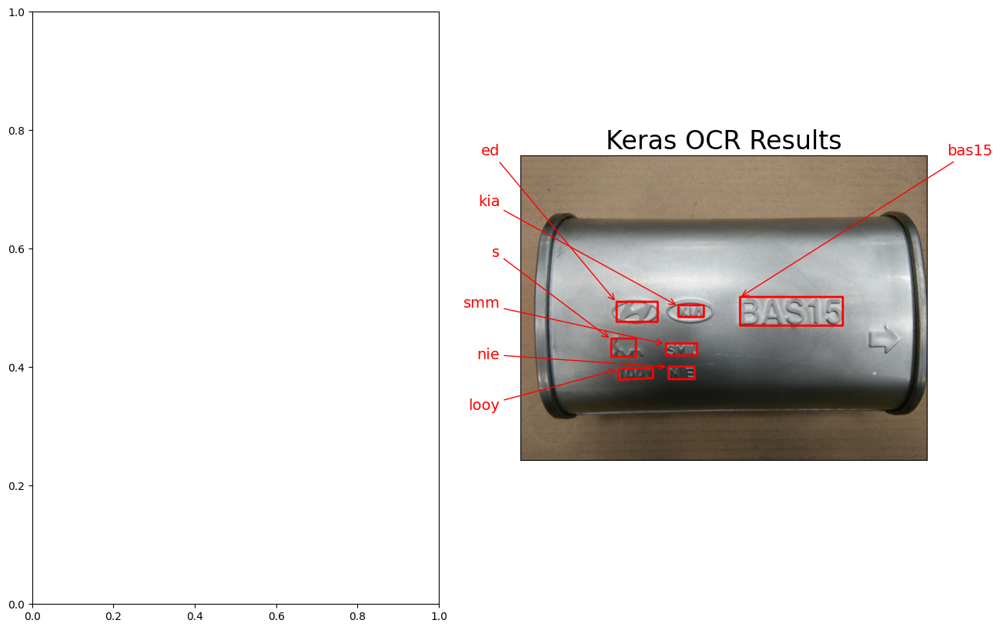

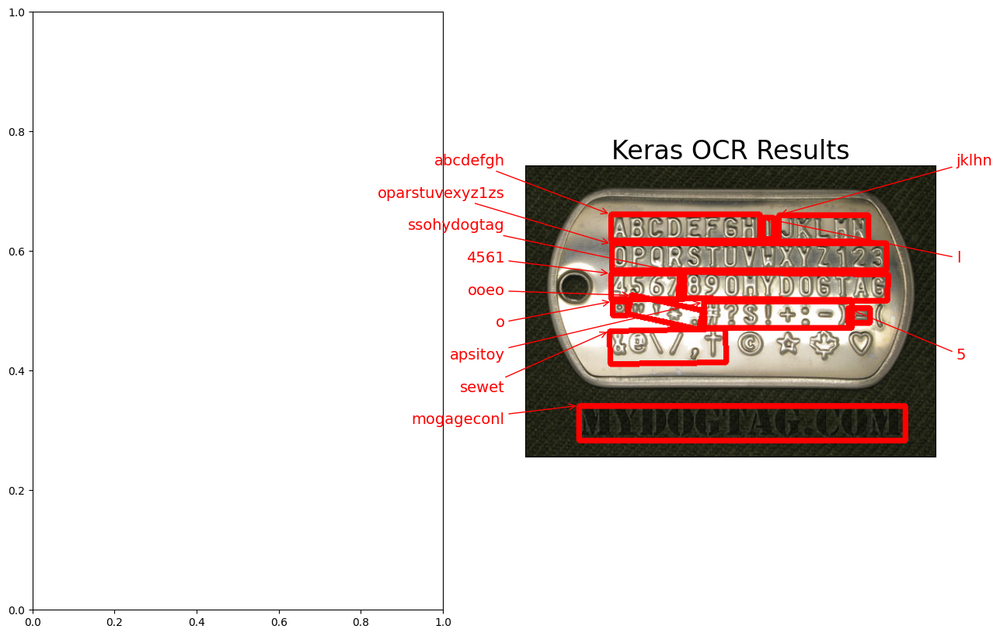

...

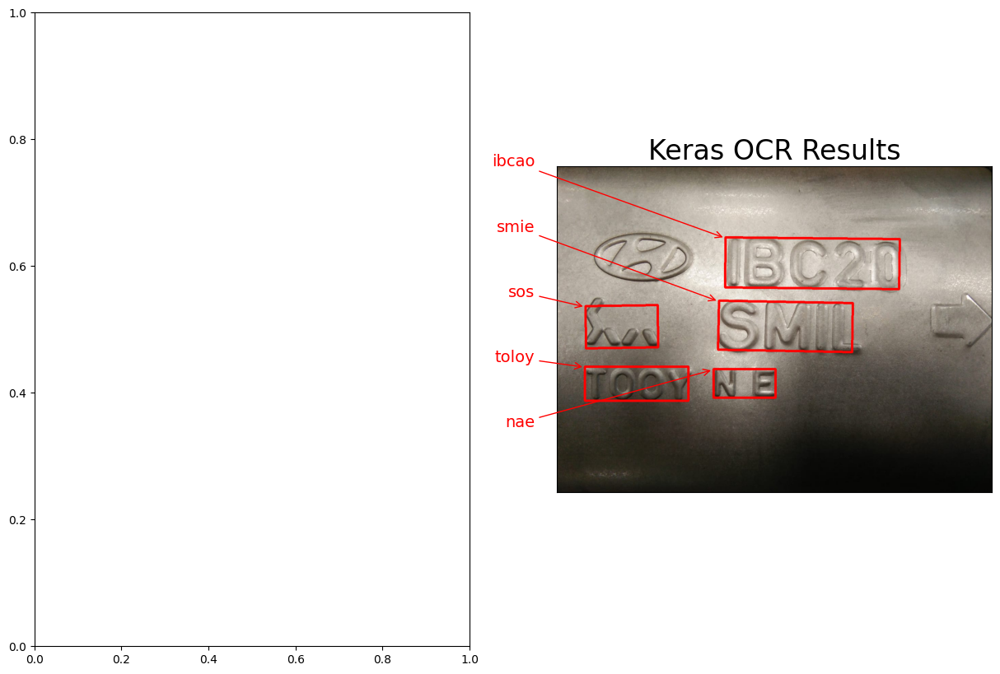

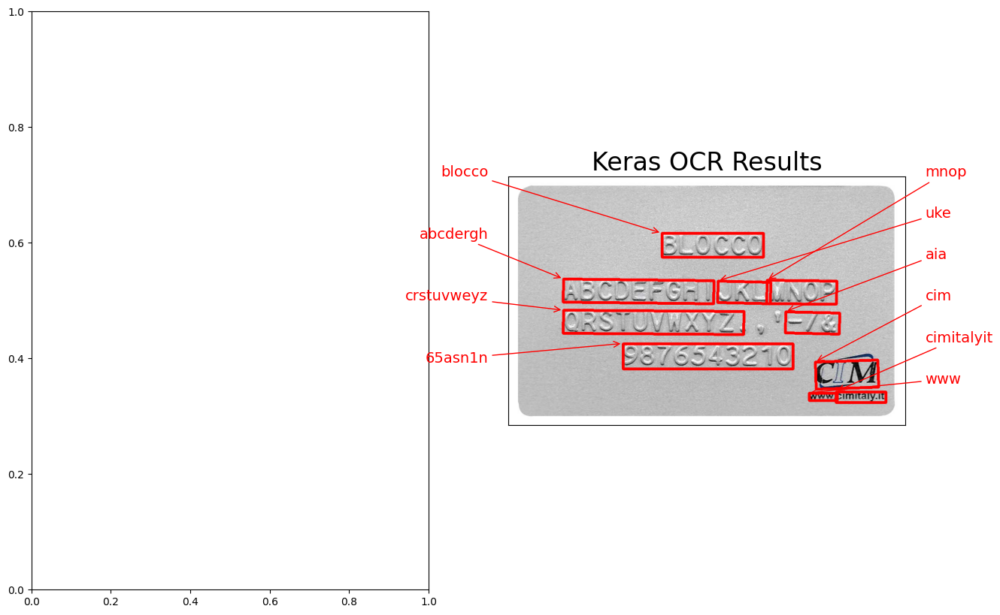

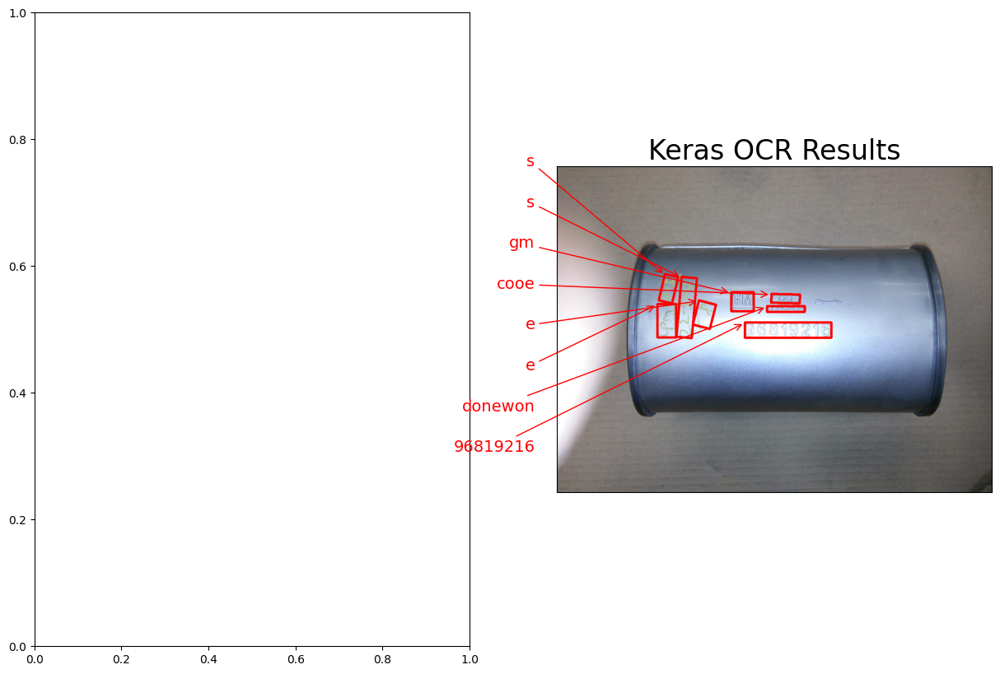

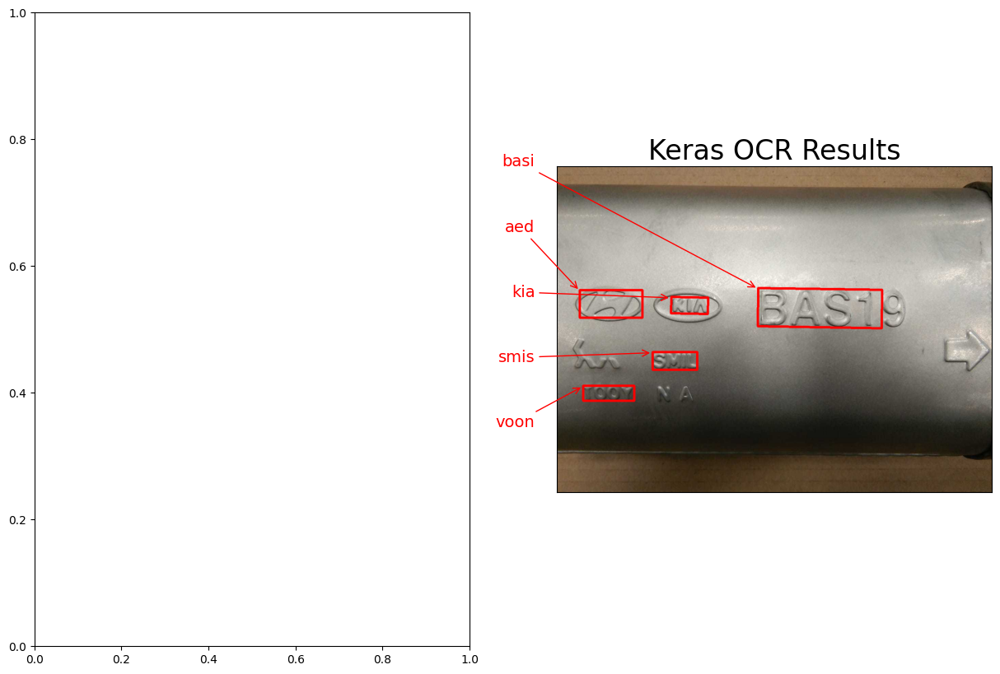

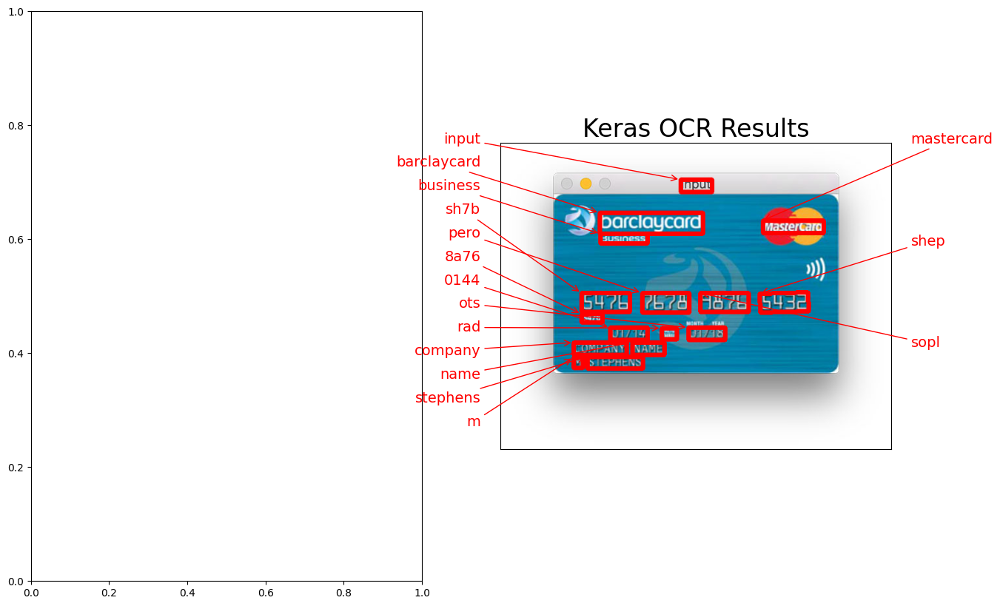

In [ ]:
images = glob('/content/*.jpg')
kerasocr_df = get_kerasocr_results(images[:25])  # Use first 25 images for Keras OCR
for img_path in images[:20]:  # Adjust the range as needed
    plot_compare(img_path, kerasocr_df)

In [ ]:
pip install --upgrade tensorflow keras keras-ocr


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 644.9/644.9 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 42.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 54.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 63.5 MB/s eta 0:00:00
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.4.1
    Uninstalling ml-dtypes-0.4.1:
      Successfully uninstalled ml-dtypes-0.4.1
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.18.0
    Uninstalling tensorboard-2.18.0:
      Successfully uninstalled tensorboard-2.18.0
  Attempting uninstall: keras
    Found existing installation: keras 3.8.0
    Uninstalling keras-3.8.0:
      Successfully uninstalled keras-3.8.0
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.18.0
    Uninstalling tensorflow-2.18.0:
      Successfully uninstalled tensorflow-2.18.0
ERROR: pip's dependency resolve

In [ ]:
pip install jiwer

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 42.7 MB/s eta 0:00:00


import os
import pandas as pd
import keras_ocr
import cv2
import numpy as np
from difflib import SequenceMatcher
from jiwer import wer


In [ ]:
import os
import pandas as pd
import keras_ocr
import cv2
import numpy as np
from difflib import SequenceMatcher
from jiwer import wer


In [ ]:
# Load the CSV file
annotations = pd.read_csv('/content/processed_annotation.csv')

# Group by 'filename' and concatenate all 'class' texts into a list
ground_truth = annotations.groupby('filename')['class'].apply(list).to_dict()

# Group by 'filename' and concatenate all 'class' texts into a list
ground_truth = annotations.groupby('filename')['class'].apply(list).to_dict()


In [ ]:
import string

def normalize_text(text):
    # Convert to lowercase
    text = text.lower()
    # Remove punctuation
    text = text.translate(str.maketrans('', '', string.punctuation))
    return text


In [ ]:
# Initialize OCR models
# please install both this if u dont have installed

!pip install keras-ocr tensorflow==2.12.0
!pip install numpy matplotlib
import keras_ocr
pipeline = keras_ocr.pipeline.Pipeline()  # Keras OCR

Looking for /root/.keras-ocr/craft_mlt_25k.h5
Looking for /root/.keras-ocr/crnn_kurapan.h5


In [ ]:
from sklearn.metrics import accuracy_score

# Initialize lists to store metrics
cer_scores = []
wer_scores = []
levenshtein_distances = []

# Iterate over each image file
for image_file in os.listdir('/content/'):
    if image_file.endswith('.jpg'):
        # Read the image
        image_path = os.path.join('/content/', image_file)
        image = keras_ocr.tools.read(image_path)

        # Perform OCR
        prediction_groups = pipeline.recognize([image])

        # Extract recognized text and normalize
        recognized_texts = [normalize_text(text) for text, box in prediction_groups[0]]

        # Concatenate all recognized texts into a single string
        recognized_text = ' '.join(recognized_texts)

        # Get ground truth text and normalize
        gt_texts = ground_truth.get(image_file, [])
        gt_texts = [normalize_text(text) for text in gt_texts]
        gt_text = ' '.join(gt_texts)

        # Compute Character Error Rate (CER)
        cer = 1 - (SequenceMatcher(None, gt_text, recognized_text).ratio())
        cer_scores.append(cer)

        # Compute Word Error Rate (WER)
        wer_score = wer(gt_text, recognized_text)
        wer_scores.append(wer_score)

        # Compute Levenshtein Distance
        levenshtein_distance = sum(1 for a, b in zip(gt_text, recognized_text) if a != b) + abs(len(gt_text) - len(recognized_text))
        levenshtein_distances.append(levenshtein_distance)

        # Print results for each image
        print(f"Image: {image_file}")
        print(f"Ground Truth: {gt_text}")
        print(f"Recognized Text: {recognized_text}")
        print(f"CER: {cer:.4f}, WER: {wer_score:.4f}, Levenshtein Distance: {levenshtein_distance}")
        print("-" * 50)

# Compute average metrics
avg_cer = np.mean(cer_scores)
avg_wer = np.mean(wer_scores)
avg_levenshtein = np.mean(levenshtein_distances)

print(f"Average CER: {avg_cer:.4f}")
print(f"Average WER: {avg_wer:.4f}")
print(f"Average Levenshtein Distance: {avg_levenshtein:.4f}")


1/1 [==============================] - 6s 6s/step
Image: 168.jpg
Ground Truth: densifique hyaluronic bain gluco peptides shampooing repulpant bodifying shampoo hair visibly lacking density 250 ml 85 floz
Recognized Text: kerastase parts densifique densite bain glucopeptides hyaluronic t shampooing repulpant densite cheveux de perte en bodifying shampoo hair density visibly lacking avancee recherche 250 flozs ml 8 5
CER: 0.4081, WER: 1.0000, Levenshtein Distance: 189
--------------------------------------------------
1/1 [==============================] - 2s 2s/step
Image: 33.jpg
Ground Truth: non trespassing we re tired of hiding the bodies
Recognized Text: no trespassing we da re tired of hiding bodies the
CER: 0.1224, WER: 0.4444, Levenshtein Distance: 46
--------------------------------------------------
1/1 [==============================] - 3s 3s/step
Image: 174.jpg
Ground Truth: carlyle fast dissolve melatonin 12 mg nighttime sleep aid 100 drug free natural berrt flavor 180 fast 

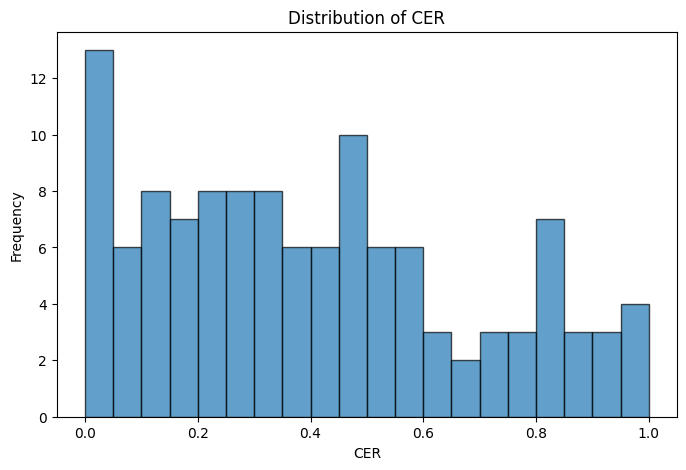

WER Statistics:
Min: 0.0000, Max: 6.3333, Mean: 1.0256, Std: 0.9230


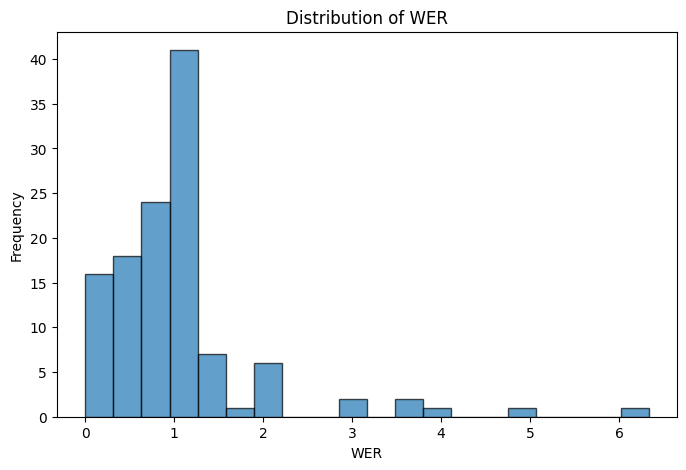

Levenshtein Distance Statistics:
Min: 0.0000, Max: 480.0000, Mean: 74.0583, Std: 92.5614


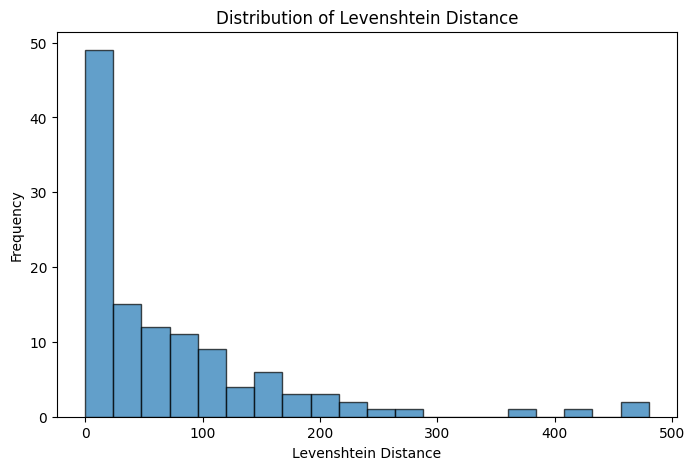

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from difflib import SequenceMatcher
from jiwer import wer
import keras_ocr

# Initialize lists to store metrics
cer_scores = []
wer_scores = []
levenshtein_distances = []

# Iterate over each image file
for image_file in os.listdir('/content/'):
    if image_file.endswith('.jpg'):
        # Read the image
        image_path = os.path.join('/content/', image_file)
        image = keras_ocr.tools.read(image_path)

        # Perform OCR
        prediction_groups = pipeline.recognize([image])

        # Extract recognized text and normalize
        recognized_texts = [normalize_text(text) for text, box in prediction_groups[0]]
        recognized_text = ' '.join(recognized_texts)

        # Get ground truth text and normalize
        gt_texts = ground_truth.get(image_file, [])
        gt_texts = [normalize_text(text) for text in gt_texts if text.strip()]

        # Skip empty ground truth cases
        if not gt_texts:
            print(f"Skipping {image_file} due to empty ground truth.")
            continue

        gt_text = ' '.join(gt_texts)

        # Compute Character Error Rate (CER)
        cer = 1 - (SequenceMatcher(None, gt_text, recognized_text).ratio())
        cer_scores.append(cer)

        # Compute Word Error Rate (WER)
        wer_score = wer(gt_text, recognized_text)
        wer_scores.append(wer_score)

        # Compute Levenshtein Distance
        levenshtein_distance = sum(1 for a, b in zip(gt_text, recognized_text) if a != b) + abs(len(gt_text) - len(recognized_text))
        levenshtein_distances.append(levenshtein_distance)

        # Print results for each image
        print(f"Image: {image_file}")
        print(f"Ground Truth: {gt_text}")
        print(f"Recognized Text: {recognized_text}")
        print(f"CER: {cer:.4f}, WER: {wer_score:.4f}, Levenshtein Distance: {levenshtein_distance}")
        print("-" * 50)

# Compute average metrics
if cer_scores:
    avg_cer = np.mean(cer_scores)
    avg_wer = np.mean(wer_scores)
    avg_levenshtein = np.mean(levenshtein_distances)

    print(f"Average CER: {avg_cer:.4f}")
    print(f"Average WER: {avg_wer:.4f}")
    print(f"Average Levenshtein Distance: {avg_levenshtein:.4f}")

    # Descriptive statistics
    def display_stats(metric_name, scores):
        print(f"{metric_name} Statistics:")
        print(f"Min: {np.min(scores):.4f}, Max: {np.max(scores):.4f}, Mean: {np.mean(scores):.4f}, Std: {np.std(scores):.4f}")

        # Plot histogram
        plt.figure(figsize=(8, 5))
        plt.hist(scores, bins=20, edgecolor='black', alpha=0.7)
        plt.xlabel(metric_name)
        plt.ylabel("Frequency")
        plt.title(f"Distribution of {metric_name}")
        plt.show()

    display_stats("CER", cer_scores)
    display_stats("WER", wer_scores)
    display_stats("Levenshtein Distance", levenshtein_distances)
else:
    print("No valid ground truth data available for analysis.")
